In [ ]:
from IPython.display import HTML

HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/y_ViyiNd_0Y" frameborder="0" allow="accelerometer;  clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')

#كيف حالك؟

In [ ]:
from IPython.display import HTML

HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/a7YVYea69oY" frameborder="0" allow="accelerometer;  clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')

In [ ]:
! pip install kaggle

In [ ]:
a = []
while(1):
    a.append('1')

In [ ]:
% cd /content/drive/MyDrive/qatar

[Errno 2] No such file or directory: '/content/drive/MyDrive/qatar'
/content


In [ ]:
% cd /content/

/content


In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp /content/kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d sabribelmadoui/arabic-sign-language-augmented-dataset 

 99% 865M/875M [00:05<00:00, 156MB/s]
100% 875M/875M [00:05<00:00, 156MB/s]


In [8]:
! unzip /content/drive/MyDrive/qatar/arabic-sign-language-augmented-dataset.zip -d /content/drive/MyDrive/qatar 

Archive:  /content/drive/MyDrive/qatar/arabic-sign-language-augmented-dataset.zip
replace /content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/data.yaml? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [2]:
!git clone https://github.com/ultralytics/yolov5
!pip install -qr yolov5/requirements.txt


import torch
from IPython.display import Image, clear_output
#from utils.google_utils import gdrive_download

#clear_output()

Cloning into 'yolov5'...
remote: Enumerating objects: 12076, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 12076 (delta 12), reused 12 (delta 3), pack-reused 12047
Receiving objects: 100% (12076/12076), 11.92 MiB | 7.19 MiB/s, done.
Resolving deltas: 100% (8370/8370), done.
     |████████████████████████████████| 596 kB 7.3 MB/s 


In [1]:
import os

In [2]:
len(os.listdir('/content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/train/labels'))

13946

In [ ]:
%cd /content

/content


In [ ]:
%pwd

'/content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/train/images'

In [3]:
#extracting information from the roboflow file
%cat /content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/data.yaml

train: /content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/train/images
val: /content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/valid/images

nc: 28
names: ['أ', 'ب', 'ت', 'ث', 'ج', 'ح', 'خ', 'د', 'ذ', 'ر', 'ز', 'س', 'ش', 'ص', 'ض', 'ط', 'ظ', 'ع', 'غ', 'ف', 'ق', 'ك', 'ل', 'م', 'ن', 'ها', 'و', 'ي']


In [4]:
# define number of classes based on data.yaml
import yaml
with open("/content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [5]:
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [6]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [7]:
num_classes

'28'

In [8]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [9]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 60 --data '/content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=60, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-230-gbf1a6dd Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5,

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/yolov5/

/content/yolov5


In [10]:
!python detect.py --weights  /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/test/images

detect: weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=/content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-230-gbf1a6dd Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7319337 parameters, 0 gradients, 17.0 GFLOPs
image 1/290 /content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/test/images/IMG_20210609_185422_jpg.rf.8aef3de140ac9e54a373d306f6b7ebc3.jpg: 416x416 1 أ, Done. (0.013s)
image 2/290 /content/drive/MyDrive/qatar/content/drive/MyDrive/augmented/test/ima

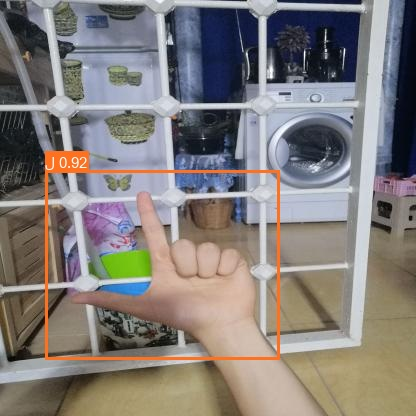

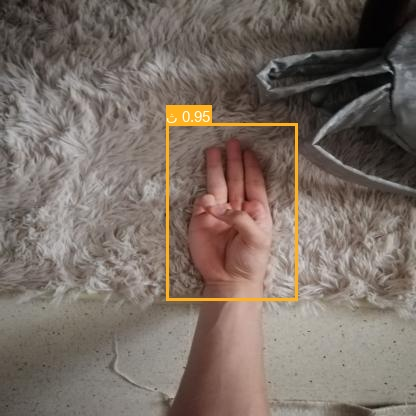

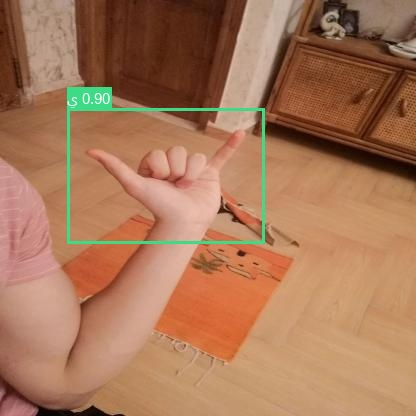

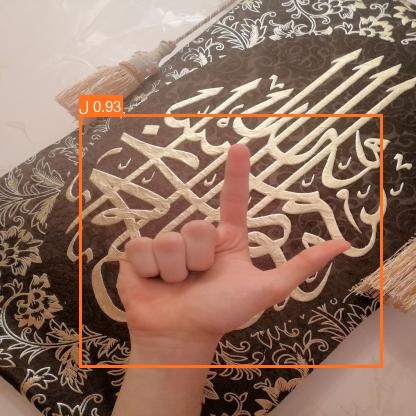

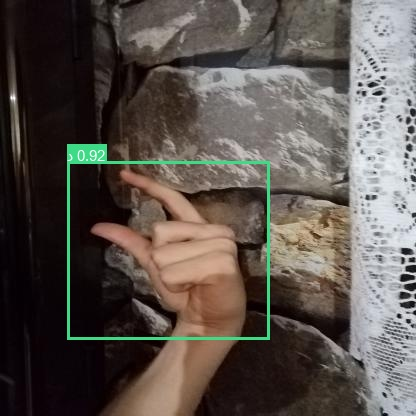

...

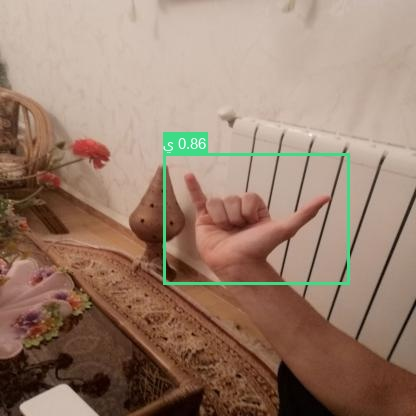

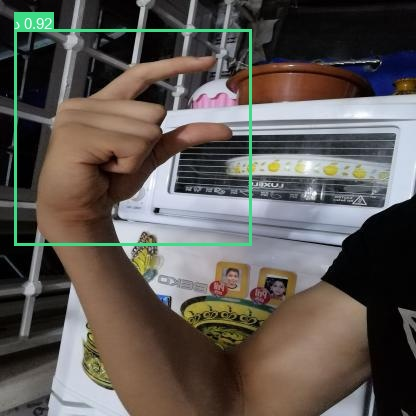

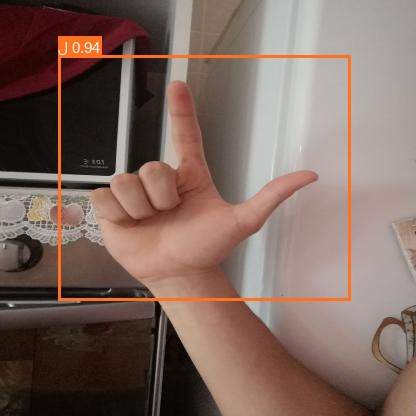

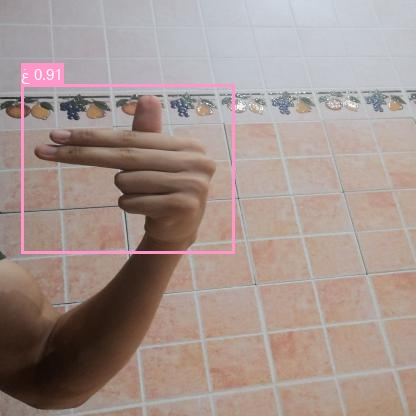

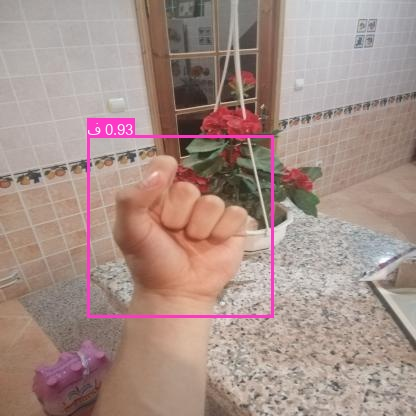

In [11]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

# For Video Detection